<a href="https://www.kaggle.com/code/hosen42/opencv-morpological-analysis-kernel-gradient?scriptVersionId=122137402" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

**What is OpenCV?**

OpenCV is an open-source software library for computer vision and machine learning. The OpenCV full form is Open Source Computer Vision Library. It was created to provide a shared infrastructure for applications for computer vision and to speed up the use of machine perception in consumer products. OpenCV, as a BSD-licensed software, makes it simple for companies to use and change the code. There are some predefined packages and libraries that make our life simple and OpenCV is one of them.

**What is Computer Vision?**

The term Computer Vision (CV) is used and heard very often in artificial intelligence (AI) and deep learning (DL) applications. The term essentially means giving a computer the ability to see the world as we humans do.

Computer Vision is a field of study which enables computers to replicate the human visual system. As already mentioned above, It’s a subset of artificial intelligence which collects information from digital images or videos and processes them to define the attributes. The entire process involves image acquiring, screening, analysing, identifying and extracting information. This extensive processing helps computers to understand any visual content and act on it accordingly.

Computer vision projects translate digital visual content into explicit descriptions to gather multi-dimensional data. This data is then turned into a computer-readable language to aid the decision-making process. The main objective of this branch of artificial intelligence is to teach machines to collect information from pixels.

**Import Library**

In [2]:
import cv2
import matplotlib.pyplot as plt
from skimage.exposure import rescale_intensity
import numpy as np
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

**Imread function in OpenCV**

In [3]:
def catImageShow(imageTitle, image):
    imageVariable = cv2.cvtColor(image,cv2.COLOR_BGR2RGB) #cvtColor(src, code[, dst[, dstCn]])
    plt.figure(figsize=(4,4))
    plt.imshow(imageVariable)
    plt.title(imageTitle) #plt.title(label, fontdict=None, loc=None, pad=None, *, y=None, **kwargs)
    plt.show() #plt.show(close=None, block=None)

**Image Read**

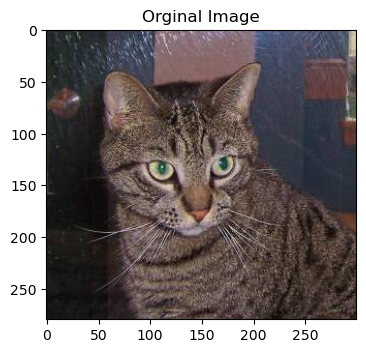

In [4]:
image = cv2.imread("/kaggle/input/cat-and-dog/training_set/training_set/cats/cat.1.jpg")
catImageShow("Orginal Image",image)

**Kernel**

In Convolutional neural network, the kernel is
nothing but a filter that is used to extract the
features from the images. The kernel is a matrix
that moves over the input data, performs the
dot product with the sub-region of input data,
and gets the output as the matrix of dot
products.

**Python OpenCV | cv2.copyMakeBorder() method**

OpenCV-Python is a library of Python bindings designed to solve computer vision problems. cv2.copyMakeBorder() method is used to create a border around the image like a photo frame. 

In [5]:
def conv(image, kernel):
    imageH, imageW = image.shape[:2]
    kernelH, kernelW = kernel.shape[:2]
    
    padding = (kernelW-1) // 2
    
    image = cv2.copyMakeBorder(image, 
                              padding, padding,
                              padding, padding, 
                              cv2.BORDER_REFLECT)
    
    
    outputmask = np.zeros((imageH, imageW), dtype= "float32")
    
    
    for y in np.arange(padding, imageH+padding):
        for x in np.arange(padding, imageW+padding):
            # ROI --> Region if Interest
            roi = image[y - padding:y+padding+1, 
                       x - padding: x+padding+1]
            k = (roi*kernel).sum()
            outputmask[y-padding, x-padding] = k
            
            
    outputmask = rescale_intensity(outputmask, in_range = (0, 255))
    outputmask = (outputmask*255).astype("uint8")
    
    return outputmask

In [6]:
imageArgs = {"image":"/kaggle/input/cat-and-dog/training_set/training_set/cats/cat.1.jpg"}

In [7]:
imageSmall = np.ones((7,7),dtype="float") * (1.0/(7*7))#np.ones(shape, dtype=None, order='C', *, like=None)
imageLarge = np.ones((21,21),dtype="float") * (1.0/(21*21))#np.ones(shape, dtype=None, order='C', *, like=None)

In [8]:
imageSmall

array([[0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816],
       [0.02040816, 0.02040816, 0.02040816, 0.02040816, 0.02040816,
        0.02040816, 0.02040816]])

In [9]:
imageLarge

array([[0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757],
       [0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757],
       [0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757],
       [0.00226757, 0.00226757, 0.00226757, 0.00226757, 0.00226757,
        0.00226757, 0.00226757, 0.00226757, 0.0022675

In [10]:
bottom_kernel = np.array([[-1, -2, -1], 
                         [0, 0, 0], 
                         [1, 2, 1]], dtype = "float")

In [11]:
custom_kernel = np.array([[-0.1, 0, 0], 
                         [0, 1, 0], 
                         [0, 0, 0]], dtype = "float")

In [12]:
emboss_kernel = np.array([[-2, -1, 0], 
                         [-1, 1, 1], 
                         [0, 1, 2]], dtype = "float")

In [13]:
sharpen_kernel = np.array([[0, -1, 0], 
                    [-1, 5, -1], 
                    [0, -1, 0]], dtype = "float")

In [14]:
identity_kernel = np.array([[0,0, 0], 
                         [0, 1, 0], 
                         [0, 0, 0]], dtype = "float")

In [15]:
left_kernel = np.array([[1,0, -1], 
                         [2, 0, -2], 
                         [1, 0, -1]], dtype = "float")

In [16]:
outline_kernel = np.array([[-1,-1,-1], 
                         [-1, 8, -1], 
                         [-1, -1, -1]], dtype = "float")

In [17]:
right_kernel = np.array([ [-1,0, 1], 
                         [-2, 0, 2], 
                         [-1, 0, 1]], dtype = "float")

In [18]:
top_kernel = np.array([[1, 2, 1], 
                      [0, 0, 0], 
                      [-1, -2, -1]], dtype = "float")

In [19]:
image  = cv2.imread(imageArgs["image"])
grayimage = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [20]:
print("Image information {}".format(image.shape))
print("\nImage information {}".format(grayimage.shape))

Image information (280, 300, 3)

Image information (280, 300)


**Python OpenCV – Filter2D() Function**

In this article, we are going to see about the filter2d() function from OpenCV. In a nutshell, with this function, we can convolve an image with the kernel (typically a 2d matrix) to apply a filter on the images.

Syntax: filter2D (src, dst, ddepth, kernel)

Parameters:  

Src – The source image to apply the filter on.

Dst – Name of the output image after applying the filter

Ddepth – Depth of the output image [ -1 will give the output image depth as same as the input image]

Kernel – The 2d matrix we want the image to convolve with.

Using this function, we can create a convolution between the image and the given kernel for creating filters like smoothing and blurring, sharpening, and edge detection in an image. This function will simply convolute the 2d matrix with the image at pixel level and produce an output image. To understand this concept, we shall first skim through the concept of the kernel.

**Kernel**

A simple 2d matrix used in convolution or Convolution Matrix or a mask used to blur, sharpen and edge detect an image.

**Working of the kernel:**

So, how this kernel works? Let’s see, we all know that images are represented as pixel values in OpenCV. These pixels are arranged as a matrix to form an image and as we know that a kernel is a simple 2d matrix with specific values in it based on the function of the kernel like if the kernel is used for blurring and sharpening the images are different. 

Let us take an example, In this image take the first 3 rows and columns like a matrix and we have a kernel of 3 by 3 matrix. Each of the pixels in the image has a pixel value (i.e. pixel intensity) as shown. Now the convolution is done by multiplying the values of each pixel value with the kernel value in the respective places and adding all the values which were just weighted by the kernel by multiplying and forming one pixel (the center pixel which in this case it is [2,2]). And this method is repeated for the rest of the pixel value matrices in the image.

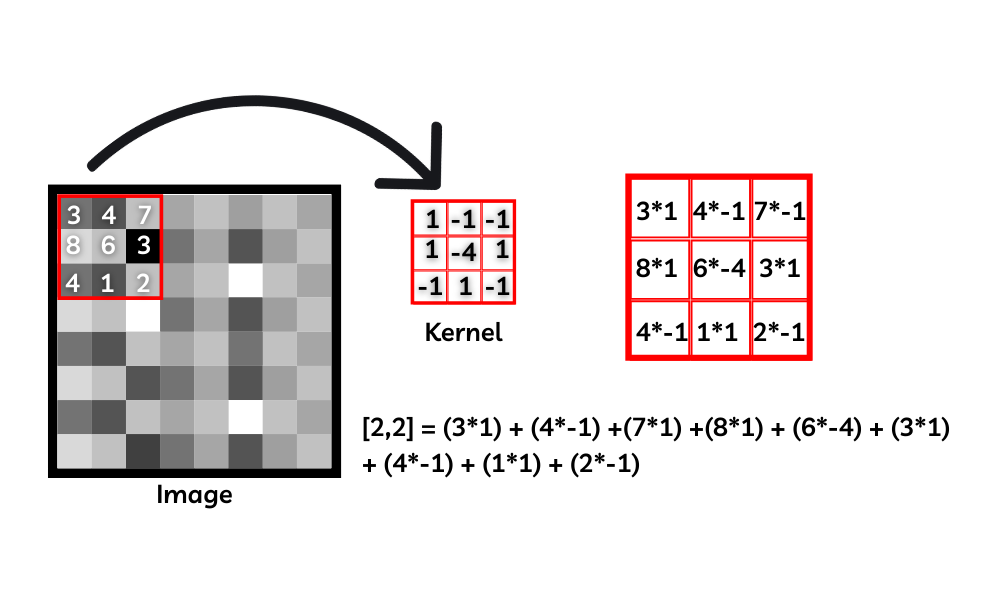

**Note:** We have specific kernels [2d convolution matrices] to do specific tasks like blurring, sharpening, and edge detection. And the kernel shown in the image is just an example and not any specific kernel.

**Some Common kernels are**

- Identity kernel
- Edge detection kernel
- Sharpening kernel
- Box blurring kernel
- Gaussian blurring kernel

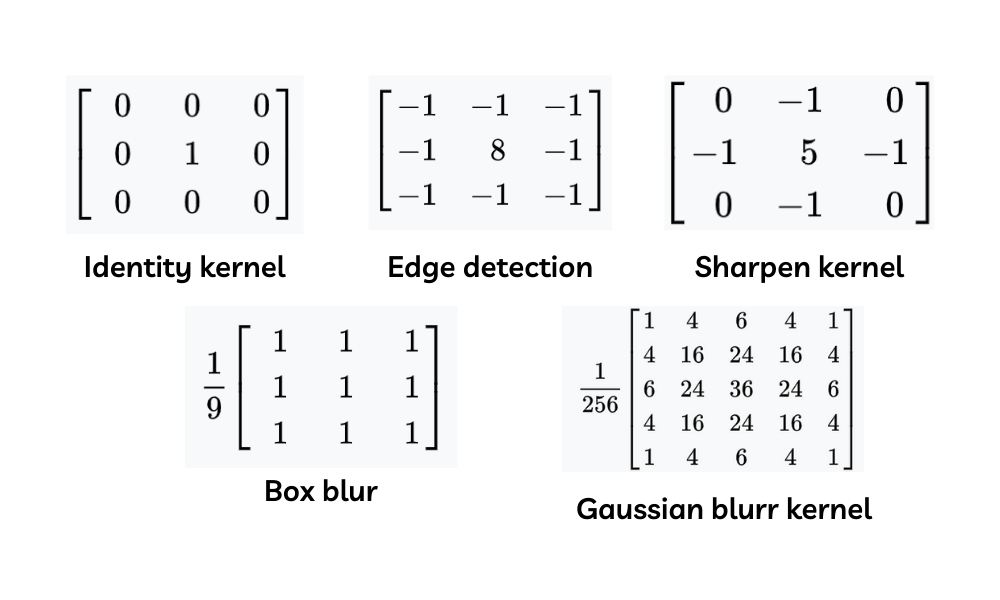

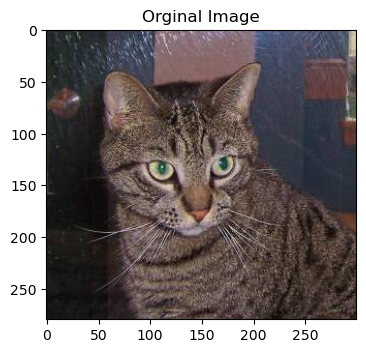

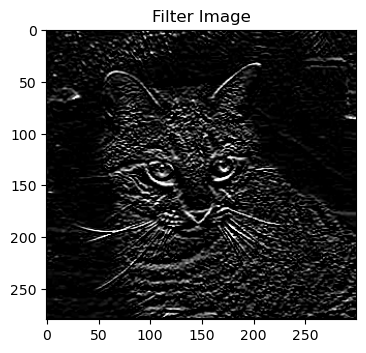

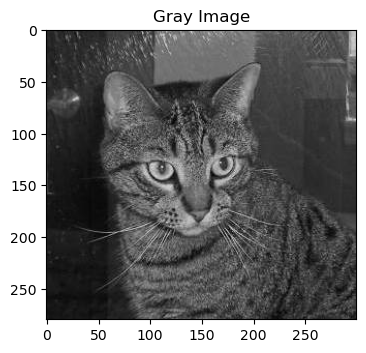

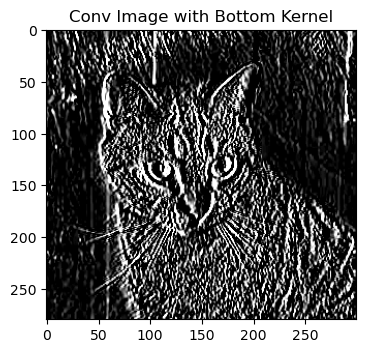

In [21]:
catImageShow("Orginal Image",image)
catImageShow("Filter Image",cv2.filter2D(grayimage,-1,bottom_kernel)) #filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None, /)
catImageShow("Gray Image",grayimage)
catImageShow("Conv Image with Bottom Kernel",conv(image,bottom_kernel))

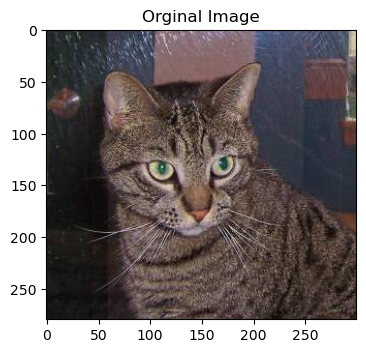

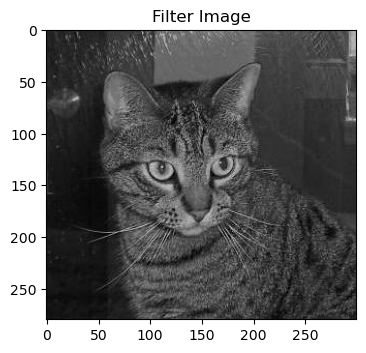

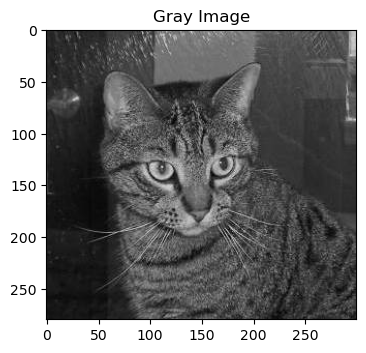

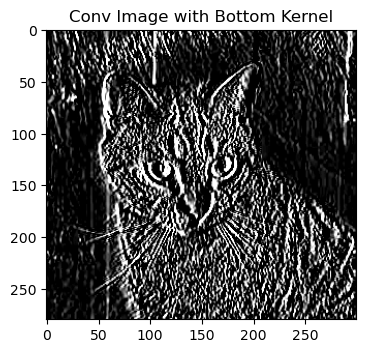

In [22]:
catImageShow("Orginal Image",image)
catImageShow("Filter Image",cv2.filter2D(grayimage,-1,custom_kernel)) #filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None, /)
catImageShow("Gray Image",grayimage)
catImageShow("Conv Image with Bottom Kernel",conv(image,bottom_kernel))

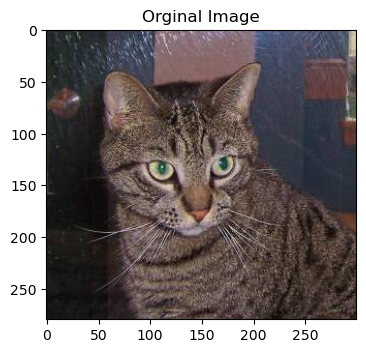

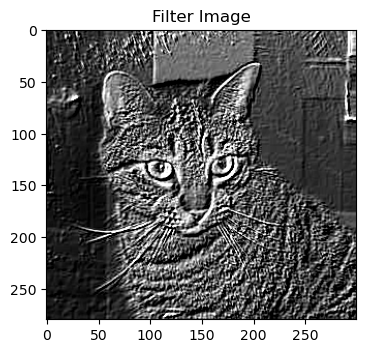

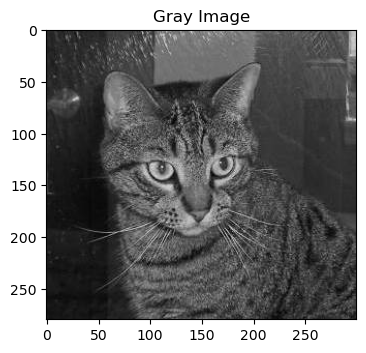

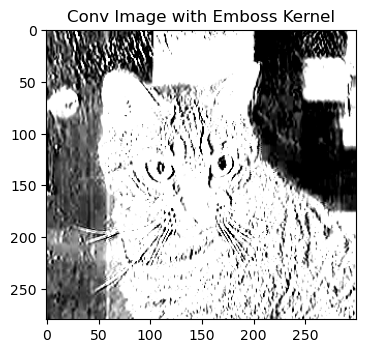

In [23]:
catImageShow("Orginal Image",image)
catImageShow("Filter Image",cv2.filter2D(grayimage,-1,emboss_kernel)) #filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None, /)
catImageShow("Gray Image",grayimage)
catImageShow("Conv Image with Emboss Kernel",conv(image,emboss_kernel))

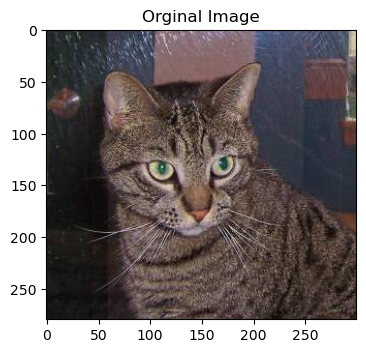

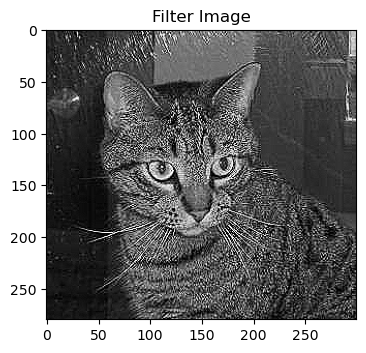

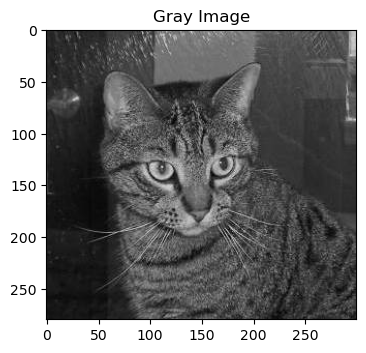

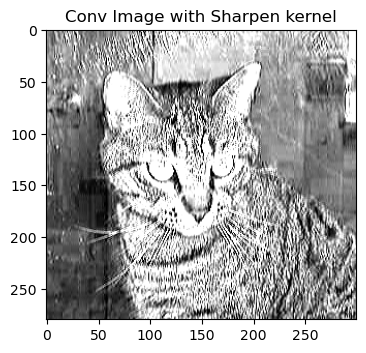

In [24]:
catImageShow("Orginal Image",image)
catImageShow("Filter Image",cv2.filter2D(grayimage,-1,sharpen_kernel)) #filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None, /)
catImageShow("Gray Image",grayimage)
catImageShow("Conv Image with Sharpen kernel",conv(image,sharpen_kernel))

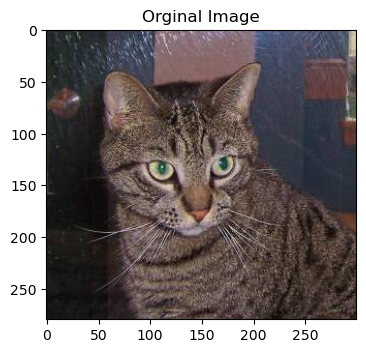

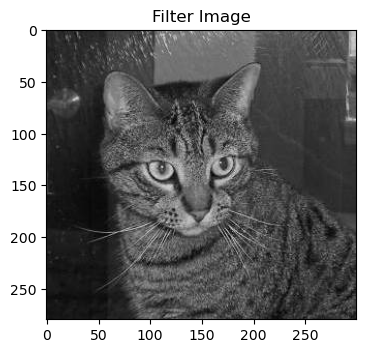

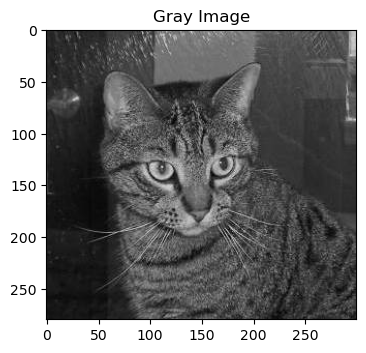

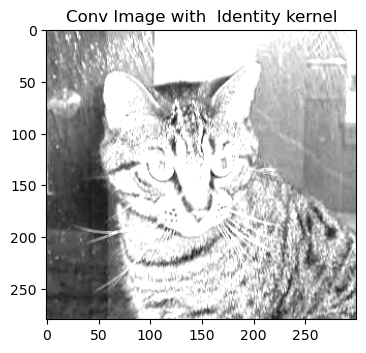

In [25]:
catImageShow("Orginal Image",image)
catImageShow("Filter Image",cv2.filter2D(grayimage,-1,identity_kernel)) #filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None, /)
catImageShow("Gray Image",grayimage) 
catImageShow("Conv Image with  Identity kernel",conv(image,identity_kernel))

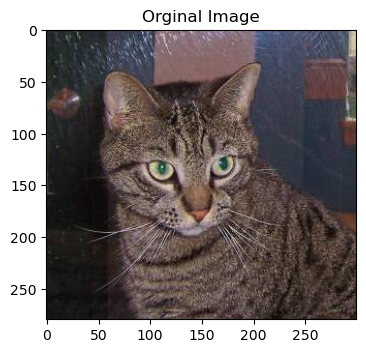

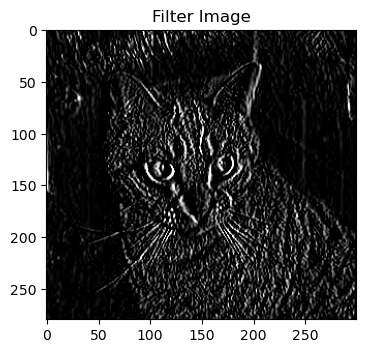

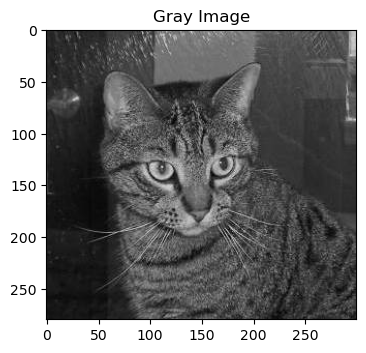

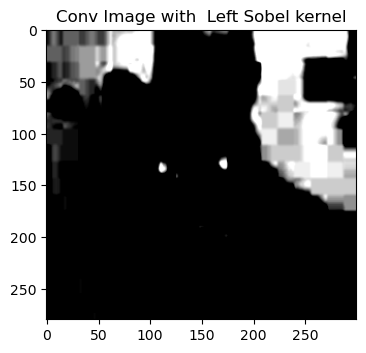

In [26]:
catImageShow("Orginal Image",image)
catImageShow("Filter Image",cv2.filter2D(grayimage,-1,left_kernel)) #filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None, /)
catImageShow("Gray Image",grayimage)
catImageShow("Conv Image with  Left Sobel kernel",conv(image,left_kernel))

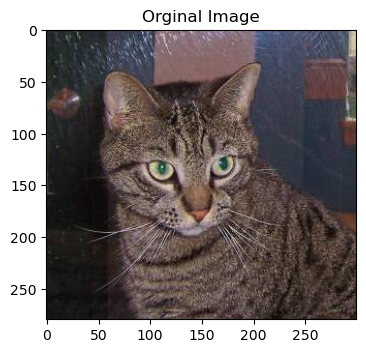

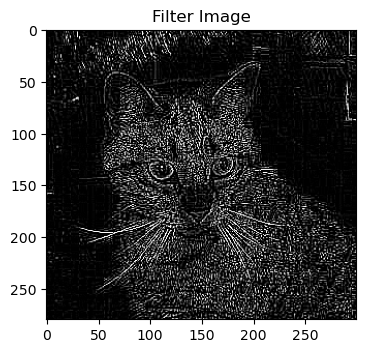

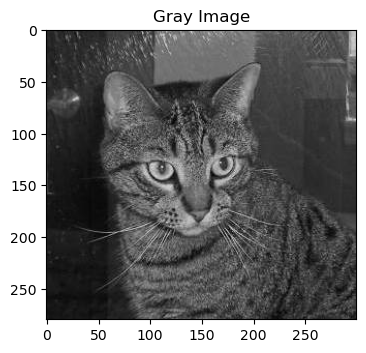

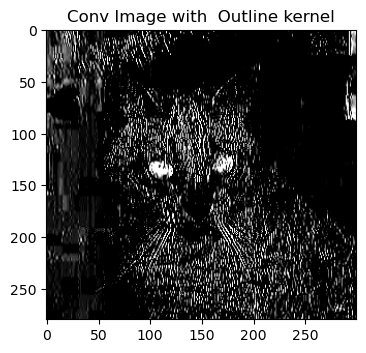

In [27]:
catImageShow("Orginal Image",image)
catImageShow("Filter Image",cv2.filter2D(grayimage,-1,outline_kernel)) #filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None, /)
catImageShow("Gray Image",grayimage)
catImageShow("Conv Image with  Outline kernel",conv(image,outline_kernel))

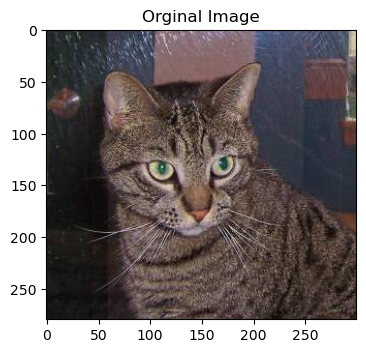

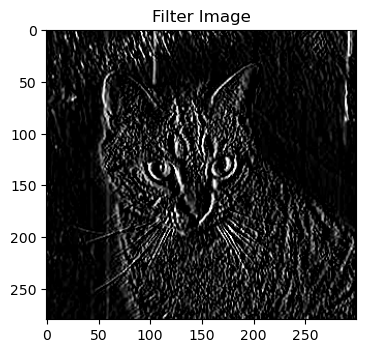

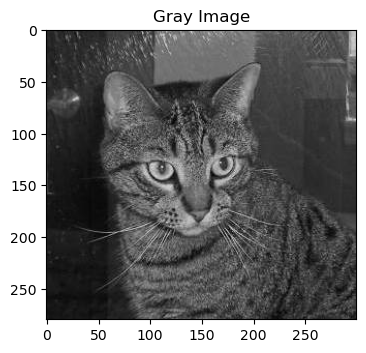

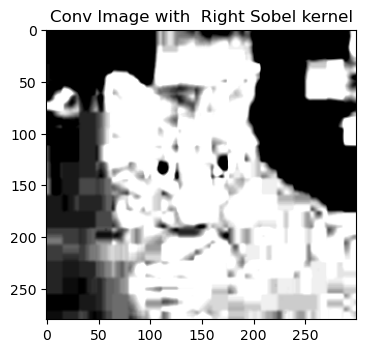

In [28]:
catImageShow("Orginal Image",image)
catImageShow("Filter Image",cv2.filter2D(grayimage,-1,right_kernel)) #filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None, /)
catImageShow("Gray Image",grayimage)
catImageShow("Conv Image with  Right Sobel kernel",conv(image,right_kernel))

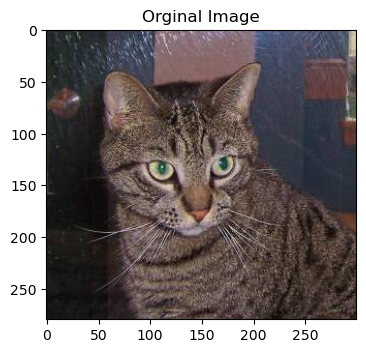

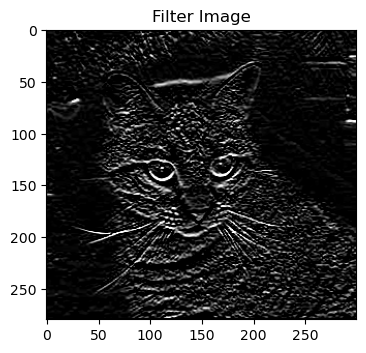

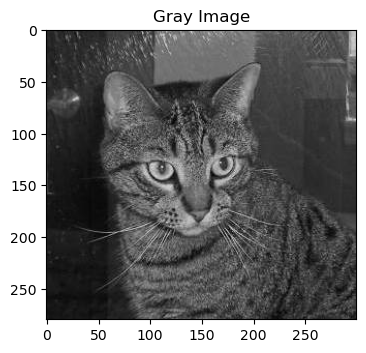

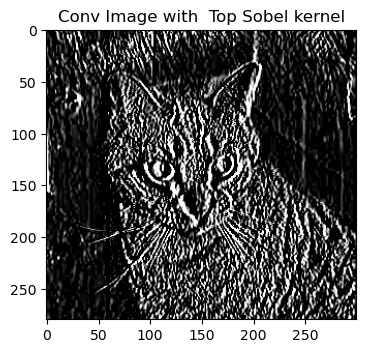

In [29]:
catImageShow("Orginal Image",image)
catImageShow("Filter Image",cv2.filter2D(grayimage,-1,top_kernel)) #filter2D(src, ddepth, kernel, dst=None, anchor=None, delta=None, borderType=None, /)
catImageShow("Gray Image",grayimage)
catImageShow("Conv Image with  Top Sobel kernel",conv(image,top_kernel))

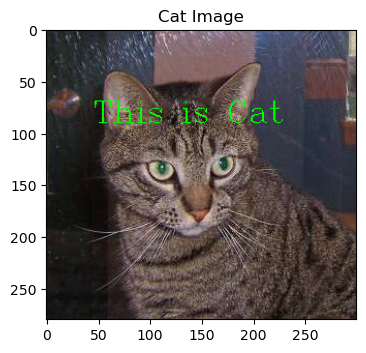

Text(0.5, 1.0, 'Image of Cat')

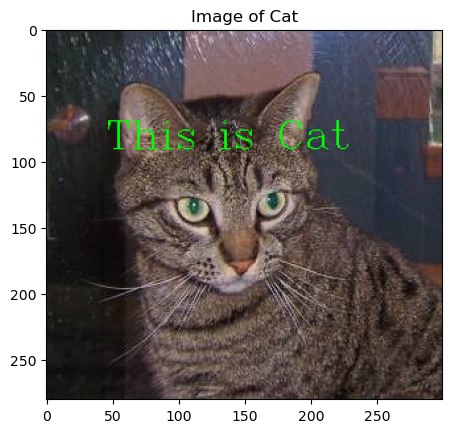

In [30]:
imageText = image.copy()
textonimage = "This is Cat"
imageCoor = (45, 90)
cv2.putText(imageText, textonimage, imageCoor, fontFace = cv2.FONT_HERSHEY_COMPLEX, 
           fontScale= 1.0,
           color = (0, 255, 0))#putText(img, text, org, fontFace, fontScale, color, thickness=None, lineType=None, bottomLeftOrigin=None, /)
catImageShow("Cat Image", imageText)
#cv2.waitKey(0)
#cv2.destroyWindow("Cat Image")

image = cv2.cvtColor(imageText, cv2.COLOR_BGR2RGB)
plt.subplot(111)
plt.imshow(image)
plt.title("Image of Cat")

Text(0.5, 1.0, 'Image of Cat')

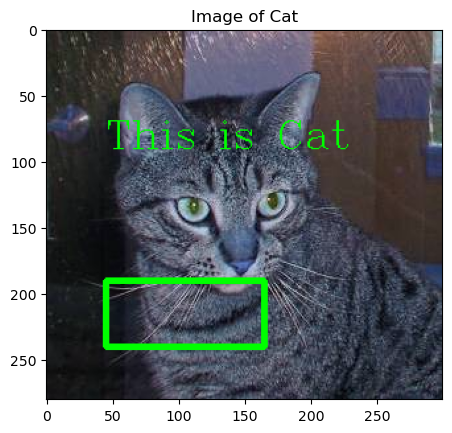

In [31]:
imageText = image.copy()
imageCoor1 = (45, 190)
imageCoor2 = (165,240)
cv2.rectangle(imageText, imageCoor1,imageCoor2,thickness = 3,color = (0, 255, 0))
image = cv2.cvtColor(imageText, cv2.COLOR_BGR2RGB)
plt.subplot(111)
plt.imshow(image)
plt.title("Image of Cat")

**Morphological Transformations**

Morphological transformations are some simple operations based on the image shape. It is normally performed on binary images. It needs two inputs, one is our original image, second one is called structuring element or kernel which decides the nature of operation. Two basic morphological operators are Erosion and Dilation. Then its variant forms like Opening, Closing, Gradient etc also comes into play. 

**Erosion**

The basic idea of erosion is just like soil erosion only, it erodes away the boundaries of foreground object (Always try to keep foreground in white). So what it does? The kernel slides through the image (as in 2D convolution). A pixel in the original image (either 1 or 0) will be considered 1 only if all the pixels under the kernel is 1, otherwise it is eroded (made to zero).

So what happends is that, all the pixels near boundary will be discarded depending upon the size of kernel. So the thickness or size of the foreground object decreases or simply white region decreases in the image. It is useful for removing small white noises (as we have seen in colorspace chapter), detach two connected objects etc.

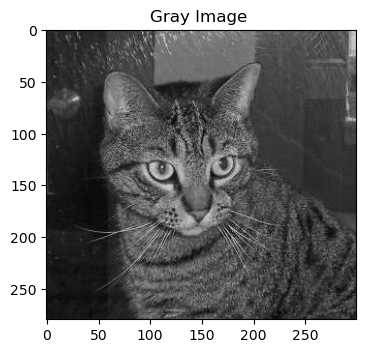

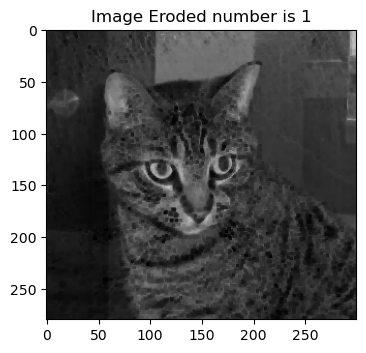

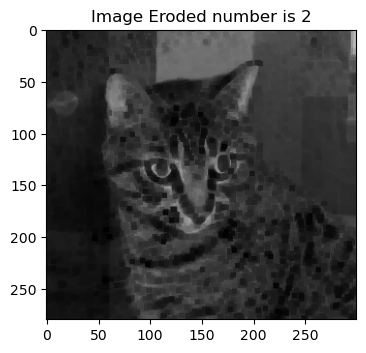

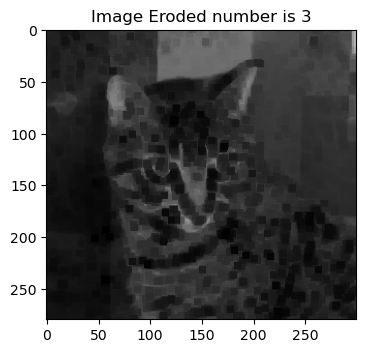

In [32]:
image=  cv2.imread(imageArgs["image"])
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #cvtColor(src, code, dst=None, dstCn=None, /) ->
catImageShow("Gray Image ",imageGray)

for i in range(0,3): #range(stop: int) range(start: int, stop: int, step: int=...)
    imageEroded = cv2.erode(imageGray,None,iterations = i+1)
    catImageShow("Image Eroded number is {}".format(i+1),imageEroded)

**Dilation**

It is just opposite of erosion. Here, a pixel element is '1' if at least one pixel under the kernel is '1'. So it increases the white region in the image or size of foreground object increases. Normally, in cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won't come back, but our object area increases. It is also useful in joining broken parts of an object.

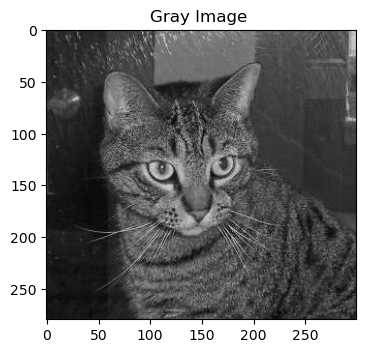

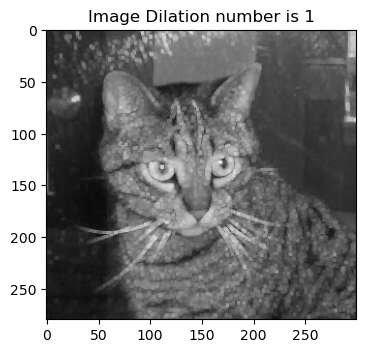

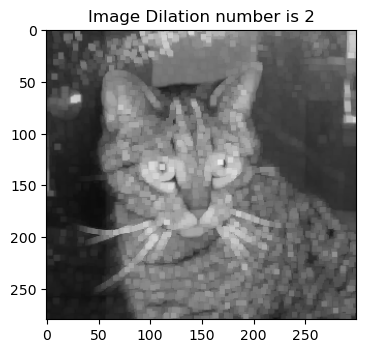

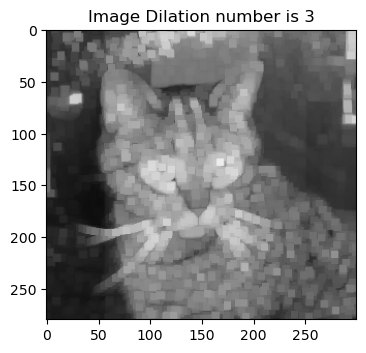

In [33]:
image=  cv2.imread(imageArgs["image"])
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #cvtColor(src, code, dst=None, dstCn=None, /) ->
catImageShow("Gray Image ",imageGray)

for i in range(0,3): #range(stop: int) range(start: int, stop: int, step: int=...)
    imageDilate = cv2.dilate(imageGray,None,iterations = i+1)#dilate(src, kernel, dst=None, anchor=None, iterations=None, borderType=None, borderValue=None, /) -> dst
    catImageShow("Image Dilation number is {}".format(i+1),imageDilate)

**Opening**

Opening is just another name of erosion followed by dilation. It is useful in removing noise, as we explained above. Here we use the function, cv.morphologyEx()

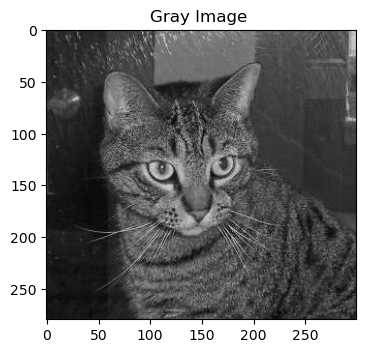

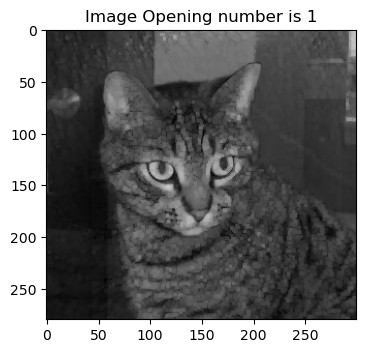

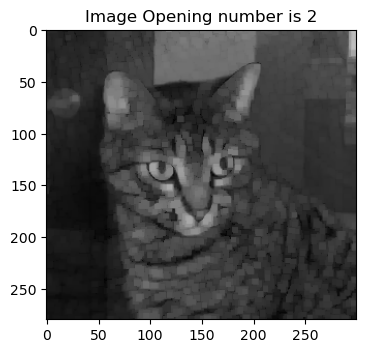

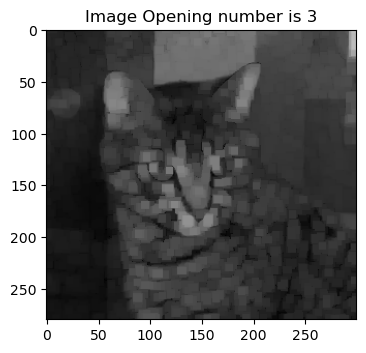

In [34]:
image=  cv2.imread(imageArgs["image"])
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #cvtColor(src, code, dst=None, dstCn=None, /) ->
catImageShow("Gray Image ",imageGray)

for i in range(0,3): #range(stop: int) range(start: int, stop: int, step: int=...)
    imageOpening = cv2.morphologyEx(imageGray,cv2.MORPH_OPEN,None,iterations = i+1)#morphologyEx(src, op, kernel, dst=None, anchor=None, iterations=None, borderType=None, borderValue=None, /) -> dst
    catImageShow("Image Opening number is {}".format(i+1),imageOpening)

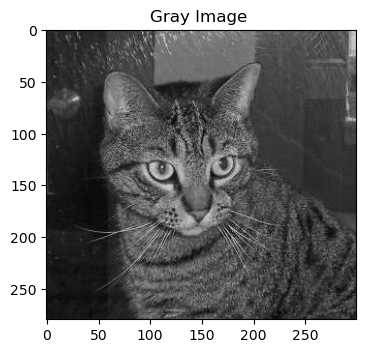

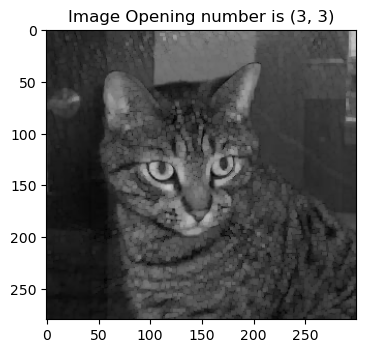

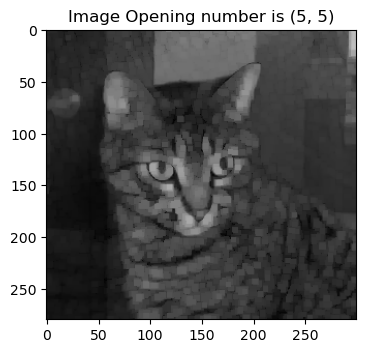

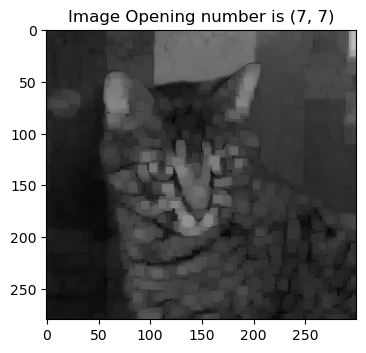

In [35]:
image=  cv2.imread(imageArgs["image"])
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #cvtColor(src, code, dst=None, dstCn=None, /) ->
catImageShow("Gray Image ",imageGray)
kernelSize = [(3,3),
             (5,5),
             (7,7)]

for i in kernelSize: #range(stop: int) range(start: int, stop: int, step: int=...)
    k = cv2.getStructuringElement(cv2.MORPH_RECT,i)
    imageOpening = cv2.morphologyEx(imageGray,cv2.MORPH_OPEN,k)#morphologyEx(src, op, kernel, dst=None, anchor=None, iterations=None, borderType=None, borderValue=None, /) -> dst
    catImageShow("Image Opening number is {}".format(i),imageOpening)

**Closing**

Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.

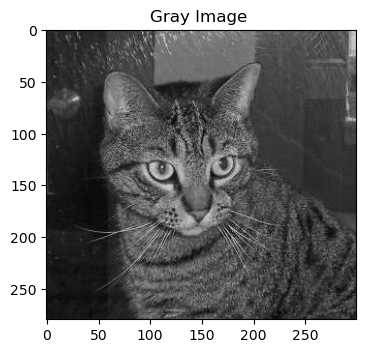

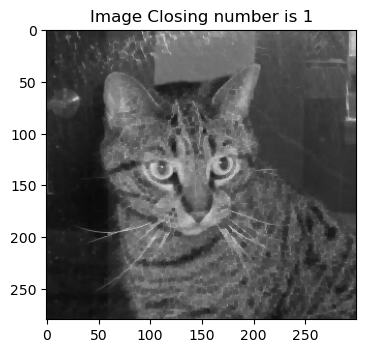

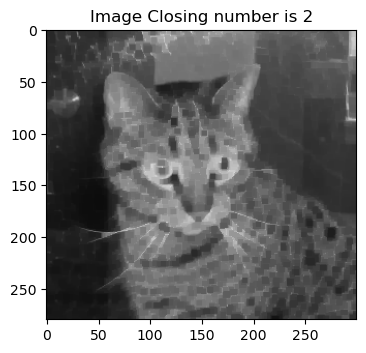

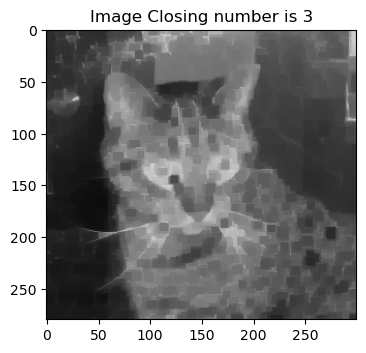

In [36]:
image=  cv2.imread(imageArgs["image"])
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #cvtColor(src, code, dst=None, dstCn=None, /) ->
catImageShow("Gray Image ",imageGray)

for i in range(0,3): #range(stop: int) range(start: int, stop: int, step: int=...)
    imageClosing = cv2.morphologyEx(imageGray,cv2.MORPH_CLOSE,None,iterations = i+1)#morphologyEx(src, op, kernel, dst=None, anchor=None, iterations=None, borderType=None, borderValue=None, /) -> dst
    catImageShow("Image Closing number is {}".format(i+1),imageClosing)

**Morphological Gradient**

It is the difference between dilation and erosion of an image.

The result will look like the outline of the object.

> gradient = cv.morphologyEx(img, cv.MORPH_GRADIENT, kernel)

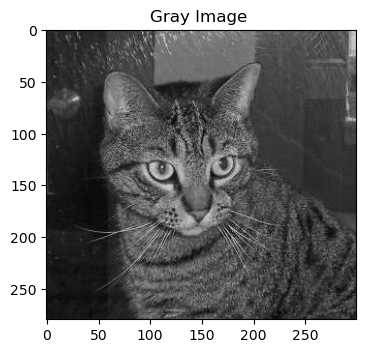

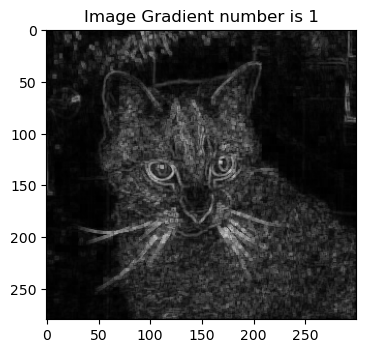

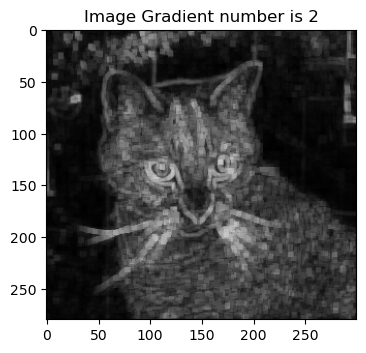

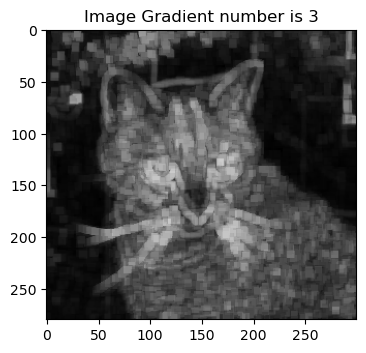

In [37]:
image=  cv2.imread(imageArgs["image"])
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #cvtColor(src, code, dst=None, dstCn=None, /) ->
catImageShow("Gray Image ",imageGray)

for i in range(0,3): #range(stop: int) range(start: int, stop: int, step: int=...)
    imageGradient = cv2.morphologyEx(imageGray,cv2.MORPH_GRADIENT,None,iterations = i+1)#morphologyEx(src, op, kernel, dst=None, anchor=None, iterations=None, borderType=None, borderValue=None, /) -> dst
    catImageShow("Image Gradient number is {}".format(i+1),imageGradient)

**Top Hat**

It is the difference between input image and Opening of the image. Below example is done for a 9x9 kernel.

*tophat = cv.morphologyEx(img, cv.MORPH_TOPHAT, kernel)*

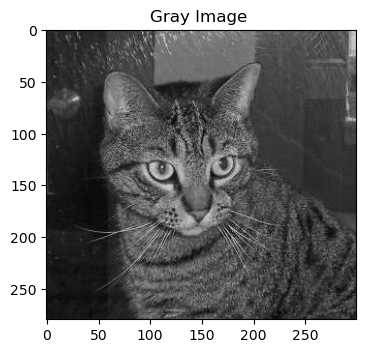

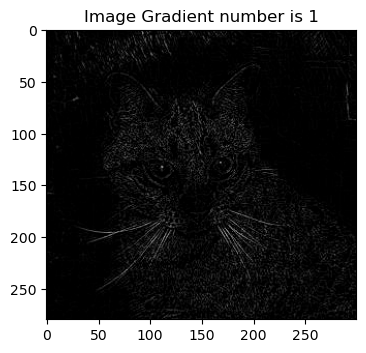

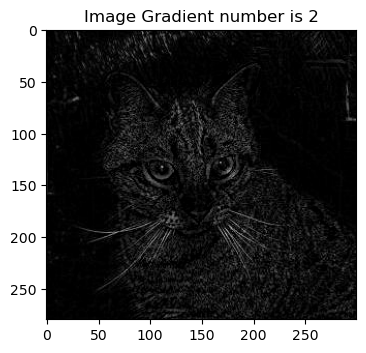

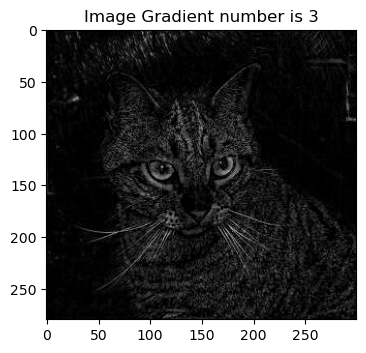

In [38]:
image=  cv2.imread(imageArgs["image"])
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #cvtColor(src, code, dst=None, dstCn=None, /) ->
catImageShow("Gray Image ",imageGray)

for i in range(0,3): #range(stop: int) range(start: int, stop: int, step: int=...)
    imageTopHat = cv2.morphologyEx(imageGray,cv2.MORPH_TOPHAT,None,iterations = i+1)#morphologyEx(src, op, kernel, dst=None, anchor=None, iterations=None, borderType=None, borderValue=None, /) -> dst
    catImageShow("Image Gradient number is {}".format(i+1),imageTopHat)

**Black Hat**

It is the difference between the closing of the input image and input image.

*blackhat = cv.morphologyEx(img, cv.MORPH_BLACKHAT, kernel)*

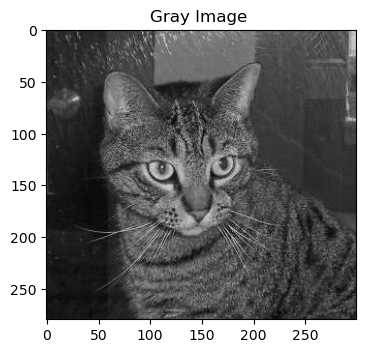

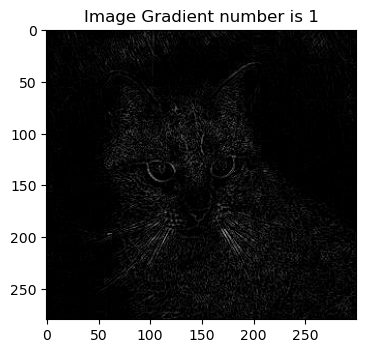

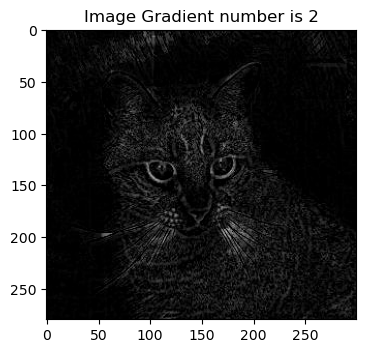

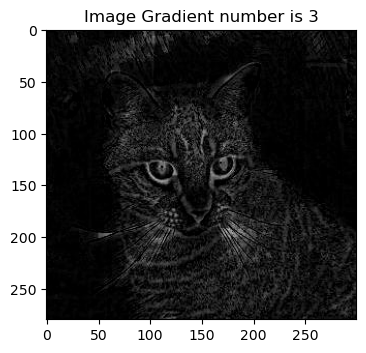

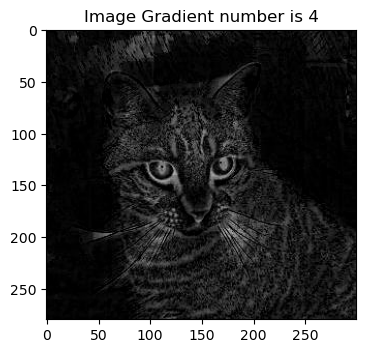

...

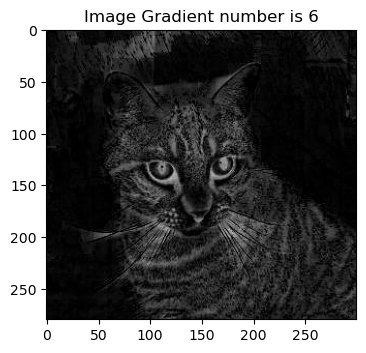

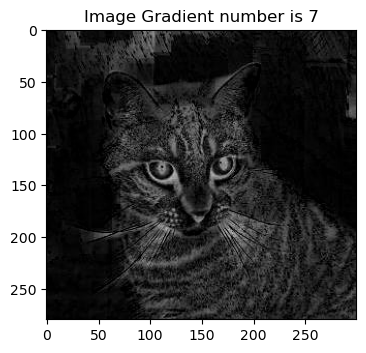

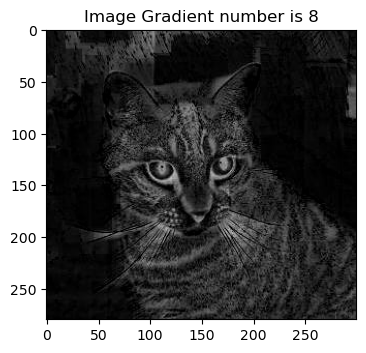

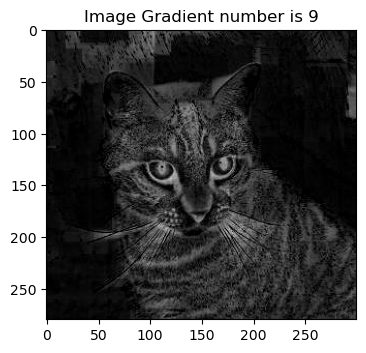

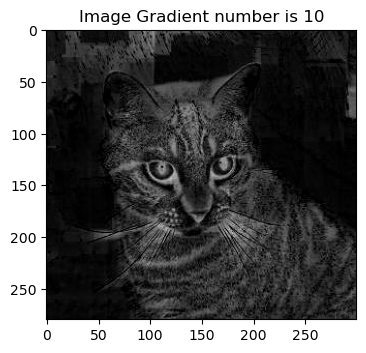

In [39]:
image=  cv2.imread(imageArgs["image"])
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #cvtColor(src, code, dst=None, dstCn=None, /) ->
catImageShow("Gray Image ",imageGray)

for i in range(0,10): #range(stop: int) range(start: int, stop: int, step: int=...)
    imageBlackHat = cv2.morphologyEx(imageGray,cv2.MORPH_BLACKHAT,None,iterations = i+1)#morphologyEx(src, op, kernel, dst=None, anchor=None, iterations=None, borderType=None, borderValue=None, /) -> dst
    catImageShow("Image Gradient number is {}".format(i+1),imageBlackHat)

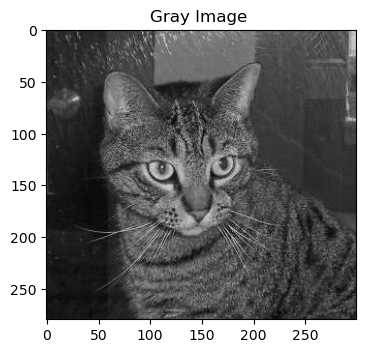

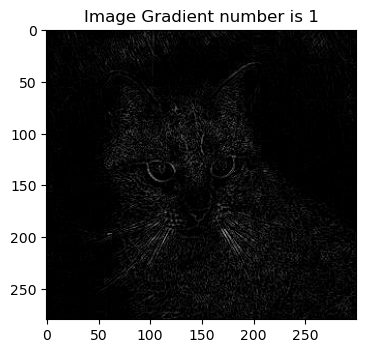

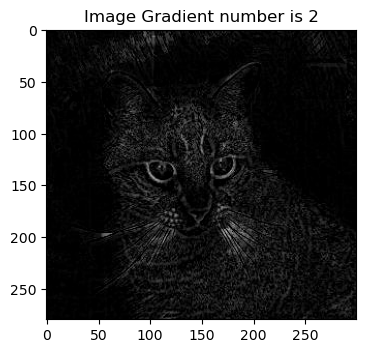

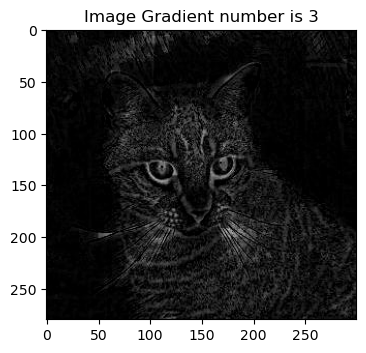

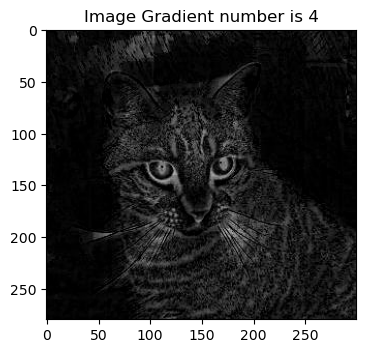

...

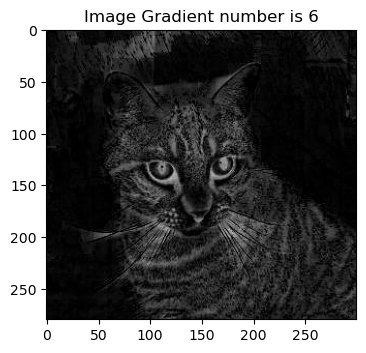

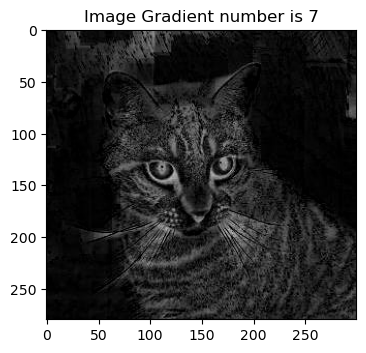

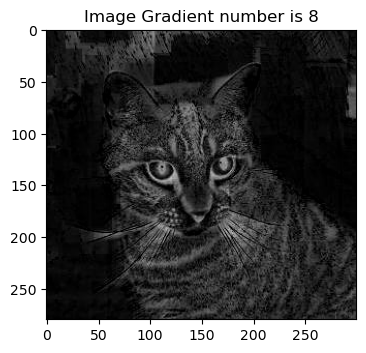

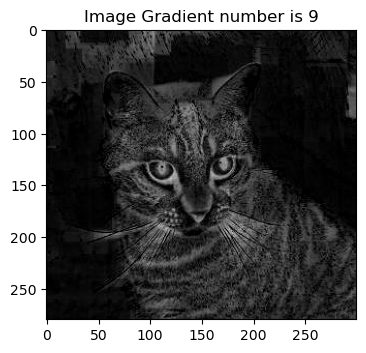

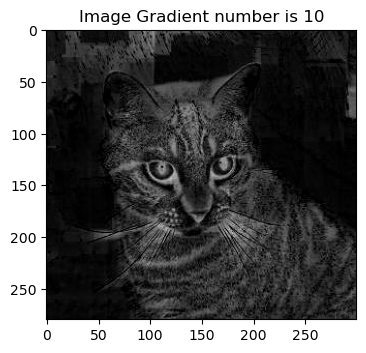

In [40]:
image=  cv2.imread(imageArgs["image"])
# imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #cvtColor(src, code, dst=None, dstCn=None, /) ->
catImageShow("Gray Image ",imageGray)

for i in range(0,10): #range(stop: int) range(start: int, stop: int, step: int=...)
    imageBlackHat = cv2.morphologyEx(imageGray,cv2.MORPH_BLACKHAT,None,iterations = i+1)#morphologyEx(src, op, kernel, dst=None, anchor=None, iterations=None, borderType=None, borderValue=None, /) -> dst
    catImageShow("Image Gradient number is {}".format(i+1),imageBlackHat)